In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
dogcdt_synapse_path = kagglehub.dataset_download('dogcdt/synapse')

print('Data source import complete.')


In [ ]:
!git clone https://github.com/xmindflow/DAEFormer.git

Cloning into 'DAEFormer'...
remote: Enumerating objects: 200, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 200 (delta 21), reused 10 (delta 10), pack-reused 177 (from 3)
Receiving objects: 100% (200/200), 188.41 KiB | 6.98 MiB/s, done.
Resolving deltas: 100% (103/103), done.


In [ ]:
import sys
sys.path.insert(0, '/kaggle/working/DAEFormer')
from networks.DAEFormer import DAEFormer
import torch
import torch.nn as nn
import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"
num_classes = 9
img_size = 128       # আপনার আসল ডেটার সাইজ
native_size = 224     # DAEFormer-এর hardcoded internal সাইজ, পরিবর্তনযোগ্য না

# আসল মডেল — কোনো এডিট নেই
daeformer_model = DAEFormer(num_classes=num_classes).to(device)

# বাইরের wrapper — শুধু resize করে, মডেল টাচ করে না
class DAEFormerWrapper(nn.Module):
    def __init__(self, model, native_size=224):
        super().__init__()
        self.model = model
        self.native_size = native_size

    def forward(self, x):
        orig_size = x.shape[-1]
        x = F.interpolate(x, size=(self.native_size, self.native_size),
                           mode='bilinear', align_corners=False)
        out = self.model(x)
        out = F.interpolate(out, size=(orig_size, orig_size),
                             mode='bilinear', align_corners=False)
        return out

model = DAEFormerWrapper(daeformer_model, native_size=native_size).to(device)

x = torch.randn(2, 3, img_size, img_size).to(device)
out = model(x)
print(out.shape)   # (2, 9, 128, 128)

torch.Size([2, 9, 128, 128])


In [ ]:
!pip install torch_optimizer
!pip install medpy
!pip install albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.3/156.3 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for medpy: filename=medpy-0.5.2-py3-none-any.whl size=224805 sha256=140bb691e9fe84429c4fcf3d7f4768522dafb9dcd0301d11d9ec63cb937cb915
  Stored in directory: /root/.cache/pip/wheels/89/5a/f8/b3def53b9c2133d2f8698ea2173bb5df63bd8e761ce8e9aec9
Successfully built medpy


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import glob
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.patches as mpatches

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import torchvision.transforms.functional as TF
import random

class SynapseDataset(Dataset):
    def __init__(self, npz_files, augment=False, image_size=(224,224)):
        self.files = []
        for f in npz_files:
            npz = np.load(f)
            image, label = npz['image'], npz['label']
            if np.max(image) > 0 and np.max(label) > 0:
                self.files.append(f)

        self.augment = augment
        self.image_size = image_size

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        npz = np.load(self.files[idx])
        image, label = npz['image'].astype(np.float32), npz['label'].astype(np.int64)

        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        image = np.expand_dims(image, axis=0)

        image = torch.from_numpy(image)
        label = torch.from_numpy(label)

        image = TF.resize(image, self.image_size)
        label = TF.resize(label.unsqueeze(0).float(), self.image_size, interpolation=TF.InterpolationMode.NEAREST).squeeze(0).long()

        if self.augment:
            image, label = self.random_augment(image, label)

        return image, label

    def random_augment(self, image, label):
        if random.random() > 0.5:
            image = TF.hflip(image)
            label = TF.hflip(label)

        angle = random.uniform(-5, 5)
        image = TF.rotate(image, angle, interpolation=TF.InterpolationMode.BILINEAR)
        label = TF.rotate(label.unsqueeze(0), angle, interpolation=TF.InterpolationMode.NEAREST).squeeze(0)

        if random.random() > 0.5:
            factor = random.uniform(0.95, 1.05)
            image = TF.adjust_brightness(image, factor)

        return image, label

In [ ]:
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

dataset_path = "/kaggle/input/datasets/dogcdt/synapse/Synapse/train_npz"
all_npz_files = sorted([os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.npz')])

# Split
train_files, val_files = train_test_split(all_npz_files, test_size=0.25, random_state=42)

train_dataset = SynapseDataset(train_files)
val_dataset = SynapseDataset(val_files)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4)

In [ ]:
images, masks = next(iter(train_loader))

print("Image batch shape:", images.shape)
print("Mask batch shape:", masks.shape)

Image batch shape: torch.Size([4, 1, 224, 224])
Mask batch shape: torch.Size([4, 224, 224])


In [ ]:
LABEL_COLORS = {
    0: (0, 0, 0),           # Background
    1: (0, 102, 204),       # Aorta
    2: (0, 255, 0),         # Gallbladder
    3: (255, 0, 0),         # Left Kidney
    4: (0, 255, 255),       # Right Kidney
    5: (255, 0, 255),       # Liver
    6: (255, 255, 0),       # Pancreas
    7: (153, 0, 255),       # Spleen
    8: (255, 128, 0),       # Stomach
}

def colorize_mask(mask):
    mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label, color in LABEL_COLORS.items():
        color_mask[mask == label] = color
    return color_mask

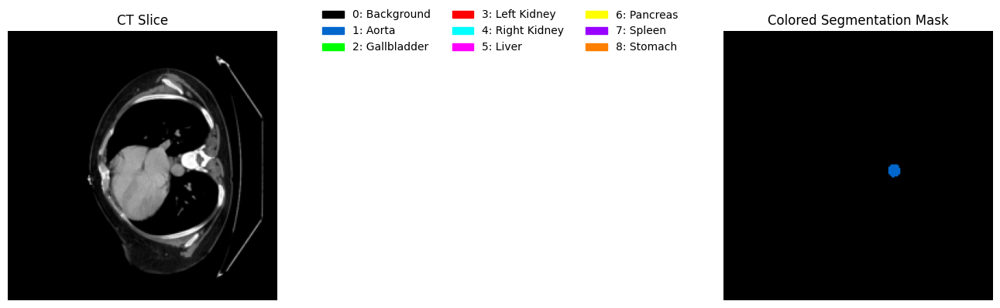

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

legend_handles = [
    mpatches.Patch(color=np.array(color)/255.0, label=f"{label_id}: {name}")
    for label_id, (name, color) in zip(
        LABEL_COLORS.keys(),
        [
            ("Background", (0,0,0)),
            ("Aorta", (0,102,204)),
            ("Gallbladder", (0,255,0)),
            ("Left Kidney", (255,0,0)),
            ("Right Kidney", (0,255,255)),
            ("Liver", (255,0,255)),
            ("Pancreas", (255,255,0)),
            ("Spleen", (153,0,255)),
            ("Stomach", (255,128,0)),
        ]
    )
]

images, masks = next(iter(train_loader))
img = images[0].squeeze().numpy()  # (H, W)
mask = masks[0]
colored_mask = colorize_mask(mask)

fig, axs = plt.subplots(1, 2, figsize=(24,4))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("CT Slice")
axs[0].axis('off')

axs[1].imshow(colored_mask)
axs[1].set_title("Colored Segmentation Mask")
axs[1].axis('off')

fig.legend(handles=legend_handles, loc='upper center', ncol=3, fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from medpy.metric.binary import hd

def dice_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    intersection = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    union = preds_onehot.sum(dim=(0,2,3)) + targets_onehot.sum(dim=(0,2,3))
    dice = (2. * intersection + eps) / (union + eps)
    return dice.mean().item()

def iou_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    intersection = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    union = (preds_onehot + targets_onehot - preds_onehot*targets_onehot).sum(dim=(0,2,3))
    iou = (intersection + eps) / (union + eps)
    return iou.mean().item()

def pixel_accuracy(preds, targets):
    return (preds.argmax(dim=1) == targets).float().mean().item()

def precision_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    tp = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    fp = (preds_onehot * (1 - targets_onehot)).sum(dim=(0,2,3))
    precision = (tp + eps) / (tp + fp + eps)
    return precision.mean().item()

def recall_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    tp = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    fn = ((1 - preds_onehot) * targets_onehot).sum(dim=(0,2,3))
    recall = (tp + eps) / (tp + fn + eps)
    return recall.mean().item()

def f1_score(preds, targets, eps=1e-7):
    prec = precision_score(preds, targets, eps)
    rec = recall_score(preds, targets, eps)
    f1 = 2 * prec * rec / (prec + rec + eps)
    return f1

def hausdorff_distance(preds, targets):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    distances = []
    for b in range(preds_onehot.shape[0]):
        for c in range(preds_onehot.shape[1]):
            p = preds_onehot[b,c].cpu().numpy().astype(bool)
            t = targets_onehot[b,c].cpu().numpy().astype(bool)
            if p.sum() == 0 or t.sum() == 0:
                distances.append(np.nan)
            else:
                try:
                    distances.append(hd(p, t))
                except:
                    distances.append(np.nan)
    return np.nanmean(distances)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class DiceLoss(nn.Module):
    def __init__(self, eps=1e-7):
        super(DiceLoss, self).__init__()
        self.eps = eps

    def forward(self, preds, targets):
        num_classes = preds.shape[1]
        preds = F.softmax(preds, dim=1)
        preds_one_hot = F.one_hot(preds.argmax(dim=1), num_classes=num_classes).permute(0,3,1,2).float()
        targets_one_hot = F.one_hot(targets, num_classes=num_classes).permute(0,3,1,2).float()

        intersection = (preds_one_hot * targets_one_hot).sum(dim=(0,2,3))
        union = preds_one_hot.sum(dim=(0,2,3)) + targets_one_hot.sum(dim=(0,2,3))
        dice = (2. * intersection + self.eps) / (union + self.eps)
        return 1 - dice.mean()

ce_loss = nn.CrossEntropyLoss()
dice_loss = DiceLoss()

def combined_loss(outputs, targets, ce_weight=0.5, dice_weight=0.5):
    return ce_weight * ce_loss(outputs, targets) + dice_weight * dice_loss(outputs, targets)

criterion = combined_loss
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5,weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", patience=4, factor=0.5)

In [ ]:
from torch.amp import autocast, GradScaler
import torch
import torch.nn.functional as F
from tqdm import tqdm

scaler = GradScaler()
accumulation_steps = 4
num_epochs =100

for epoch in range(1, num_epochs + 1):
    model.train()
    train_loss = 0.0
    train_dice = train_acc = train_iou = train_hd = 0.0
    train_mean_iou = train_precision = train_recall = train_f1 = 0.0

    optimizer.zero_grad()

    for step, (images, masks) in tqdm(enumerate(train_loader)):
        images, masks = images.to(device), masks.to(device)

        with autocast(device_type='cuda', dtype=torch.float16):
            outputs = model(images)  # [B, C, H, W]
            loss = criterion(outputs, masks) / accumulation_steps

        scaler.scale(loss).backward()

        if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        train_loss += loss.item() * accumulation_steps
        train_dice += dice_score(outputs, masks)
        train_acc += pixel_accuracy(outputs, masks)
        train_iou += iou_score(outputs, masks)
        train_hd += hausdorff_distance(outputs, masks)
        train_mean_iou += iou_score(outputs, masks)
        train_precision += precision_score(outputs, masks)
        train_recall += recall_score(outputs, masks)
        train_f1 += f1_score(outputs, masks)

    n_train = len(train_loader)
    avg_train_loss = train_loss / n_train
    avg_train_dice = train_dice / n_train
    avg_train_acc = train_acc / n_train
    avg_train_iou = train_iou / n_train
    avg_train_hd = train_hd / n_train
    avg_train_mean_iou = train_mean_iou / n_train
    avg_train_precision = train_precision / n_train
    avg_train_recall = train_recall / n_train
    avg_train_f1 = train_f1 / n_train

    model.eval()
    val_loss = 0.0
    val_dice = val_acc = val_iou = val_hd = 0.0
    val_mean_iou = val_precision = val_recall = val_f1 = 0.0

    with torch.no_grad():
        for images, masks in tqdm(val_loader):
            images, masks = images.to(device), masks.to(device)
            with autocast(device_type='cuda', dtype=torch.float16):
                outputs = model(images)
                loss = criterion(outputs, masks)

            val_loss += loss.item()
            val_dice += dice_score(outputs, masks)
            val_acc += pixel_accuracy(outputs, masks)
            val_iou += iou_score(outputs, masks)
            val_hd += hausdorff_distance(outputs, masks)
            val_mean_iou += iou_score(outputs, masks)
            val_precision += precision_score(outputs, masks)
            val_recall += recall_score(outputs, masks)
            val_f1 += f1_score(outputs, masks)

    n_val = len(val_loader)
    avg_val_loss = val_loss / n_val
    avg_val_dice = val_dice / n_val
    avg_val_acc = val_acc / n_val
    avg_val_iou = val_iou / n_val
    avg_val_hd = val_hd / n_val
    avg_val_mean_iou = val_mean_iou / n_val
    avg_val_precision = val_precision / n_val
    avg_val_recall = val_recall / n_val
    avg_val_f1 = val_f1 / n_val

    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch:2d} | "
          f"Train Loss: {avg_train_loss:.6f} | Dice: {avg_train_dice:.4f} | Acc: {avg_train_acc:.4f} | "
          f"IoU: {avg_train_iou:.4f} | mIoU: {avg_train_mean_iou:.4f} | Precision: {avg_train_precision:.4f} | Recall: {avg_train_recall:.4f} | F1: {avg_train_f1:.4f} | HD: {avg_train_hd:.4f} || "
          f"Val Loss: {avg_val_loss:.6f} | Dice: {avg_val_dice:.4f} | Acc: {avg_val_acc:.4f} | "
          f"IoU: {avg_val_iou:.4f} | mIoU: {avg_val_mean_iou:.4f} | Precision: {avg_val_precision:.4f} | Recall: {avg_val_recall:.4f} | F1: {avg_val_f1:.4f} | HD: {avg_val_hd:.4f}")

240it [01:05,  3.67it/s]
100%|██████████| 81/81 [00:12<00:00,  6.51it/s]

Epoch  1 | Train Loss: 0.641265 | Dice: 0.2125 | Acc: 0.8874 | IoU: 0.2071 | mIoU: 0.2071 | Precision: 0.8671 | Recall: 0.2365 | F1: 0.3330 | HD: 107.0707 || Val Loss: 0.532954 | Dice: 0.2089 | Acc: 0.9253 | IoU: 0.2040 | mIoU: 0.2040 | Precision: 0.9173 | Recall: 0.2137 | F1: 0.3284 | HD: 85.5402



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:10<00:00,  7.39it/s]

Epoch  2 | Train Loss: 0.502600 | Dice: 0.2466 | Acc: 0.9279 | IoU: 0.2360 | mIoU: 0.2360 | Precision: 0.9275 | Recall: 0.2509 | F1: 0.3779 | HD: 74.9151 || Val Loss: 0.509693 | Dice: 0.2182 | Acc: 0.9285 | IoU: 0.2098 | mIoU: 0.2098 | Precision: 0.9308 | Recall: 0.2215 | F1: 0.3399 | HD: 80.1438



240it [01:00,  3.95it/s]
100%|██████████| 81/81 [00:11<00:00,  7.19it/s]

Epoch  3 | Train Loss: 0.481245 | Dice: 0.2710 | Acc: 0.9357 | IoU: 0.2541 | mIoU: 0.2541 | Precision: 0.9427 | Recall: 0.2773 | F1: 0.4120 | HD: 66.4788 || Val Loss: 0.482221 | Dice: 0.2596 | Acc: 0.9426 | IoU: 0.2416 | mIoU: 0.2416 | Precision: 0.9492 | Recall: 0.2629 | F1: 0.3962 | HD: 63.5770



240it [01:00,  3.94it/s]
100%|██████████| 81/81 [00:11<00:00,  7.15it/s]

Epoch  4 | Train Loss: 0.468279 | Dice: 0.2844 | Acc: 0.9427 | IoU: 0.2653 | mIoU: 0.2653 | Precision: 0.9519 | Recall: 0.2890 | F1: 0.4274 | HD: 61.3713 || Val Loss: 0.470056 | Dice: 0.2711 | Acc: 0.9466 | IoU: 0.2525 | mIoU: 0.2525 | Precision: 0.9497 | Recall: 0.2814 | F1: 0.4198 | HD: 57.6876



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.21it/s]

Epoch  5 | Train Loss: 0.454186 | Dice: 0.2981 | Acc: 0.9480 | IoU: 0.2795 | mIoU: 0.2795 | Precision: 0.9575 | Recall: 0.3038 | F1: 0.4411 | HD: 60.7254 || Val Loss: 0.456740 | Dice: 0.2814 | Acc: 0.9516 | IoU: 0.2640 | mIoU: 0.2640 | Precision: 0.9478 | Recall: 0.2871 | F1: 0.4268 | HD: 60.1003



240it [01:02,  3.87it/s]
100%|██████████| 81/81 [00:12<00:00,  6.60it/s]

Epoch  6 | Train Loss: 0.441549 | Dice: 0.3040 | Acc: 0.9532 | IoU: 0.2862 | mIoU: 0.2862 | Precision: 0.8845 | Recall: 0.3137 | F1: 0.4479 | HD: 57.8473 || Val Loss: 0.444256 | Dice: 0.2853 | Acc: 0.9561 | IoU: 0.2658 | mIoU: 0.2658 | Precision: 0.7726 | Recall: 0.3036 | F1: 0.4232 | HD: 59.3644



240it [01:04,  3.75it/s]
100%|██████████| 81/81 [00:12<00:00,  6.45it/s]

Epoch  7 | Train Loss: 0.427798 | Dice: 0.3122 | Acc: 0.9572 | IoU: 0.2919 | mIoU: 0.2919 | Precision: 0.8065 | Recall: 0.3230 | F1: 0.4448 | HD: 56.9858 || Val Loss: 0.421652 | Dice: 0.3140 | Acc: 0.9594 | IoU: 0.2887 | mIoU: 0.2887 | Precision: 0.7877 | Recall: 0.3224 | F1: 0.4460 | HD: 57.1182



240it [01:04,  3.69it/s]
100%|██████████| 81/81 [00:12<00:00,  6.61it/s]

Epoch  8 | Train Loss: 0.409836 | Dice: 0.3320 | Acc: 0.9608 | IoU: 0.3068 | mIoU: 0.3068 | Precision: 0.7876 | Recall: 0.3532 | F1: 0.4708 | HD: 52.9658 || Val Loss: 0.417983 | Dice: 0.3183 | Acc: 0.9598 | IoU: 0.2962 | mIoU: 0.2962 | Precision: 0.8733 | Recall: 0.3121 | F1: 0.4483 | HD: 51.5686



240it [01:06,  3.62it/s]
100%|██████████| 81/81 [00:13<00:00,  5.82it/s]

Epoch  9 | Train Loss: 0.392175 | Dice: 0.3533 | Acc: 0.9632 | IoU: 0.3231 | mIoU: 0.3231 | Precision: 0.7396 | Recall: 0.3791 | F1: 0.4849 | HD: 50.2892 || Val Loss: 0.389057 | Dice: 0.3504 | Acc: 0.9650 | IoU: 0.3134 | mIoU: 0.3134 | Precision: 0.6262 | Recall: 0.3873 | F1: 0.4680 | HD: 49.8744



240it [01:09,  3.46it/s]
100%|██████████| 81/81 [00:14<00:00,  5.42it/s]

Epoch 10 | Train Loss: 0.366620 | Dice: 0.3806 | Acc: 0.9683 | IoU: 0.3393 | mIoU: 0.3393 | Precision: 0.6276 | Recall: 0.4201 | F1: 0.4904 | HD: 46.1412 || Val Loss: 0.355193 | Dice: 0.3934 | Acc: 0.9699 | IoU: 0.3410 | mIoU: 0.3410 | Precision: 0.5987 | Recall: 0.4339 | F1: 0.4908 | HD: 43.0520



240it [01:12,  3.33it/s]
100%|██████████| 81/81 [00:15<00:00,  5.23it/s]

Epoch 11 | Train Loss: 0.331562 | Dice: 0.4339 | Acc: 0.9717 | IoU: 0.3769 | mIoU: 0.3769 | Precision: 0.6467 | Recall: 0.4737 | F1: 0.5346 | HD: 39.1596 || Val Loss: 0.313658 | Dice: 0.4626 | Acc: 0.9736 | IoU: 0.3964 | mIoU: 0.3964 | Precision: 0.6526 | Recall: 0.4870 | F1: 0.5481 | HD: 35.3675



240it [01:13,  3.26it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 12 | Train Loss: 0.283564 | Dice: 0.5105 | Acc: 0.9769 | IoU: 0.4394 | mIoU: 0.4394 | Precision: 0.6900 | Recall: 0.5550 | F1: 0.6048 | HD: 33.1127 || Val Loss: 0.267405 | Dice: 0.5418 | Acc: 0.9771 | IoU: 0.4616 | mIoU: 0.4616 | Precision: 0.6553 | Recall: 0.5995 | F1: 0.6194 | HD: 32.8141



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.15it/s]

Epoch 13 | Train Loss: 0.248948 | Dice: 0.5684 | Acc: 0.9798 | IoU: 0.4924 | mIoU: 0.4924 | Precision: 0.7259 | Recall: 0.6141 | F1: 0.6554 | HD: 28.6017 || Val Loss: 0.232431 | Dice: 0.6004 | Acc: 0.9802 | IoU: 0.5193 | mIoU: 0.5193 | Precision: 0.7527 | Recall: 0.6177 | F1: 0.6720 | HD: 26.9069



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.16it/s]

Epoch 14 | Train Loss: 0.208701 | Dice: 0.6359 | Acc: 0.9835 | IoU: 0.5576 | mIoU: 0.5576 | Precision: 0.7694 | Recall: 0.6781 | F1: 0.7118 | HD: 24.6949 || Val Loss: 0.220760 | Dice: 0.6171 | Acc: 0.9812 | IoU: 0.5356 | mIoU: 0.5356 | Precision: 0.7833 | Recall: 0.6290 | F1: 0.6919 | HD: 24.6359



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 15 | Train Loss: 0.178317 | Dice: 0.6889 | Acc: 0.9857 | IoU: 0.6116 | mIoU: 0.6116 | Precision: 0.8015 | Recall: 0.7238 | F1: 0.7536 | HD: 21.8097 || Val Loss: 0.197109 | Dice: 0.6584 | Acc: 0.9828 | IoU: 0.5741 | mIoU: 0.5741 | Precision: 0.7258 | Recall: 0.7287 | F1: 0.7203 | HD: 25.0444



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.06it/s]

Epoch 16 | Train Loss: 0.157497 | Dice: 0.7243 | Acc: 0.9875 | IoU: 0.6503 | mIoU: 0.6503 | Precision: 0.8243 | Recall: 0.7638 | F1: 0.7870 | HD: 19.1043 || Val Loss: 0.168813 | Dice: 0.7091 | Acc: 0.9851 | IoU: 0.6269 | mIoU: 0.6269 | Precision: 0.7550 | Recall: 0.7689 | F1: 0.7575 | HD: 23.6219



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 17 | Train Loss: 0.141725 | Dice: 0.7517 | Acc: 0.9886 | IoU: 0.6802 | mIoU: 0.6802 | Precision: 0.8298 | Recall: 0.7919 | F1: 0.8060 | HD: 17.2213 || Val Loss: 0.160905 | Dice: 0.7213 | Acc: 0.9860 | IoU: 0.6400 | mIoU: 0.6400 | Precision: 0.7744 | Recall: 0.7702 | F1: 0.7675 | HD: 21.2802



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 18 | Train Loss: 0.124804 | Dice: 0.7813 | Acc: 0.9899 | IoU: 0.7131 | mIoU: 0.7131 | Precision: 0.8492 | Recall: 0.8169 | F1: 0.8289 | HD: 15.1125 || Val Loss: 0.153107 | Dice: 0.7354 | Acc: 0.9865 | IoU: 0.6578 | mIoU: 0.6578 | Precision: 0.8259 | Recall: 0.7472 | F1: 0.7813 | HD: 17.7458



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.01it/s]

Epoch 19 | Train Loss: 0.120107 | Dice: 0.7887 | Acc: 0.9903 | IoU: 0.7222 | mIoU: 0.7222 | Precision: 0.8499 | Recall: 0.8278 | F1: 0.8339 | HD: 13.6742 || Val Loss: 0.149204 | Dice: 0.7400 | Acc: 0.9873 | IoU: 0.6619 | mIoU: 0.6619 | Precision: 0.7934 | Recall: 0.7846 | F1: 0.7836 | HD: 18.9358



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 20 | Train Loss: 0.110044 | Dice: 0.8061 | Acc: 0.9912 | IoU: 0.7425 | mIoU: 0.7425 | Precision: 0.8545 | Recall: 0.8521 | F1: 0.8487 | HD: 12.3265 || Val Loss: 0.149599 | Dice: 0.7384 | Acc: 0.9873 | IoU: 0.6609 | mIoU: 0.6609 | Precision: 0.8019 | Recall: 0.7815 | F1: 0.7865 | HD: 18.5070



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 21 | Train Loss: 0.098894 | Dice: 0.8271 | Acc: 0.9914 | IoU: 0.7650 | mIoU: 0.7650 | Precision: 0.8694 | Recall: 0.8635 | F1: 0.8624 | HD: 11.5531 || Val Loss: 0.141815 | Dice: 0.7539 | Acc: 0.9873 | IoU: 0.6767 | mIoU: 0.6767 | Precision: 0.7889 | Recall: 0.8055 | F1: 0.7929 | HD: 18.2649



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 22 | Train Loss: 0.093863 | Dice: 0.8365 | Acc: 0.9916 | IoU: 0.7721 | mIoU: 0.7721 | Precision: 0.8799 | Recall: 0.8604 | F1: 0.8669 | HD: 11.8783 || Val Loss: 0.138221 | Dice: 0.7592 | Acc: 0.9879 | IoU: 0.6830 | mIoU: 0.6830 | Precision: 0.7967 | Recall: 0.8187 | F1: 0.8019 | HD: 18.7993



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 23 | Train Loss: 0.083794 | Dice: 0.8540 | Acc: 0.9925 | IoU: 0.7944 | mIoU: 0.7944 | Precision: 0.8872 | Recall: 0.8788 | F1: 0.8806 | HD: 9.6748 || Val Loss: 0.125357 | Dice: 0.7819 | Acc: 0.9889 | IoU: 0.7077 | mIoU: 0.7077 | Precision: 0.8034 | Recall: 0.8373 | F1: 0.8164 | HD: 16.9095



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 24 | Train Loss: 0.078004 | Dice: 0.8644 | Acc: 0.9928 | IoU: 0.8077 | mIoU: 0.8077 | Precision: 0.8918 | Recall: 0.8914 | F1: 0.8897 | HD: 9.6322 || Val Loss: 0.126353 | Dice: 0.7800 | Acc: 0.9889 | IoU: 0.7066 | mIoU: 0.7066 | Precision: 0.8317 | Recall: 0.8109 | F1: 0.8171 | HD: 15.5055



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 25 | Train Loss: 0.072740 | Dice: 0.8738 | Acc: 0.9932 | IoU: 0.8190 | mIoU: 0.8190 | Precision: 0.8977 | Recall: 0.8985 | F1: 0.8961 | HD: 8.8118 || Val Loss: 0.124086 | Dice: 0.7843 | Acc: 0.9890 | IoU: 0.7099 | mIoU: 0.7099 | Precision: 0.8123 | Recall: 0.8361 | F1: 0.8195 | HD: 17.7132



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.18it/s]

Epoch 26 | Train Loss: 0.067239 | Dice: 0.8842 | Acc: 0.9934 | IoU: 0.8296 | mIoU: 0.8296 | Precision: 0.9052 | Recall: 0.9031 | F1: 0.9025 | HD: 8.8200 || Val Loss: 0.121647 | Dice: 0.7895 | Acc: 0.9891 | IoU: 0.7157 | mIoU: 0.7157 | Precision: 0.8200 | Recall: 0.8349 | F1: 0.8235 | HD: 15.4093



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 27 | Train Loss: 0.063135 | Dice: 0.8913 | Acc: 0.9937 | IoU: 0.8389 | mIoU: 0.8389 | Precision: 0.9083 | Recall: 0.9113 | F1: 0.9082 | HD: 7.6935 || Val Loss: 0.126530 | Dice: 0.7814 | Acc: 0.9888 | IoU: 0.7052 | mIoU: 0.7052 | Precision: 0.8658 | Recall: 0.7839 | F1: 0.8200 | HD: 14.0020



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.14it/s]

Epoch 28 | Train Loss: 0.062471 | Dice: 0.8920 | Acc: 0.9939 | IoU: 0.8414 | mIoU: 0.8414 | Precision: 0.9099 | Recall: 0.9126 | F1: 0.9097 | HD: 7.6469 || Val Loss: 0.117117 | Dice: 0.7973 | Acc: 0.9895 | IoU: 0.7261 | mIoU: 0.7261 | Precision: 0.8459 | Recall: 0.8257 | F1: 0.8320 | HD: 14.9350



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.12it/s]

Epoch 29 | Train Loss: 0.063498 | Dice: 0.8905 | Acc: 0.9937 | IoU: 0.8387 | mIoU: 0.8387 | Precision: 0.9104 | Recall: 0.9104 | F1: 0.9090 | HD: 8.2355 || Val Loss: 0.125617 | Dice: 0.7812 | Acc: 0.9891 | IoU: 0.7078 | mIoU: 0.7078 | Precision: 0.7823 | Recall: 0.8705 | F1: 0.8198 | HD: 16.8870



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.17it/s]

Epoch 30 | Train Loss: 0.067597 | Dice: 0.8821 | Acc: 0.9937 | IoU: 0.8324 | mIoU: 0.8324 | Precision: 0.8986 | Recall: 0.9159 | F1: 0.9053 | HD: 8.6033 || Val Loss: 0.119437 | Dice: 0.7959 | Acc: 0.9889 | IoU: 0.7200 | mIoU: 0.7200 | Precision: 0.8640 | Recall: 0.8022 | F1: 0.8290 | HD: 14.3395



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.06it/s]

Epoch 31 | Train Loss: 0.059097 | Dice: 0.8978 | Acc: 0.9941 | IoU: 0.8485 | mIoU: 0.8485 | Precision: 0.9132 | Recall: 0.9227 | F1: 0.9160 | HD: 7.6184 || Val Loss: 0.120269 | Dice: 0.7915 | Acc: 0.9893 | IoU: 0.7190 | mIoU: 0.7190 | Precision: 0.8000 | Recall: 0.8668 | F1: 0.8280 | HD: 16.0940



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 32 | Train Loss: 0.060027 | Dice: 0.8960 | Acc: 0.9941 | IoU: 0.8475 | mIoU: 0.8475 | Precision: 0.9122 | Recall: 0.9194 | F1: 0.9140 | HD: 7.7676 || Val Loss: 0.122876 | Dice: 0.7867 | Acc: 0.9891 | IoU: 0.7147 | mIoU: 0.7147 | Precision: 0.7992 | Recall: 0.8570 | F1: 0.8226 | HD: 19.3617



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 33 | Train Loss: 0.055324 | Dice: 0.9045 | Acc: 0.9944 | IoU: 0.8568 | mIoU: 0.8568 | Precision: 0.9178 | Recall: 0.9238 | F1: 0.9193 | HD: 7.1441 || Val Loss: 0.115256 | Dice: 0.7993 | Acc: 0.9900 | IoU: 0.7288 | mIoU: 0.7288 | Precision: 0.8207 | Recall: 0.8595 | F1: 0.8356 | HD: 14.4615



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.10it/s]

Epoch 34 | Train Loss: 0.052885 | Dice: 0.9085 | Acc: 0.9947 | IoU: 0.8637 | mIoU: 0.8637 | Precision: 0.9202 | Recall: 0.9285 | F1: 0.9232 | HD: 6.3408 || Val Loss: 0.118348 | Dice: 0.7932 | Acc: 0.9899 | IoU: 0.7231 | mIoU: 0.7231 | Precision: 0.8213 | Recall: 0.8472 | F1: 0.8296 | HD: 15.0308



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 35 | Train Loss: 0.058032 | Dice: 0.8992 | Acc: 0.9943 | IoU: 0.8514 | mIoU: 0.8514 | Precision: 0.9116 | Recall: 0.9245 | F1: 0.9164 | HD: 7.8276 || Val Loss: 0.115352 | Dice: 0.7995 | Acc: 0.9899 | IoU: 0.7294 | mIoU: 0.7294 | Precision: 0.8279 | Recall: 0.8488 | F1: 0.8341 | HD: 16.4994



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 36 | Train Loss: 0.050394 | Dice: 0.9129 | Acc: 0.9949 | IoU: 0.8694 | mIoU: 0.8694 | Precision: 0.9231 | Recall: 0.9335 | F1: 0.9272 | HD: 6.0495 || Val Loss: 0.108185 | Dice: 0.8120 | Acc: 0.9905 | IoU: 0.7443 | mIoU: 0.7443 | Precision: 0.8441 | Recall: 0.8508 | F1: 0.8442 | HD: 14.2690



240it [01:15,  3.20it/s]
100%|██████████| 81/81 [00:16<00:00,  5.02it/s]

Epoch 37 | Train Loss: 0.049169 | Dice: 0.9153 | Acc: 0.9949 | IoU: 0.8724 | mIoU: 0.8724 | Precision: 0.9288 | Recall: 0.9322 | F1: 0.9290 | HD: 6.5748 || Val Loss: 0.122408 | Dice: 0.7860 | Acc: 0.9898 | IoU: 0.7157 | mIoU: 0.7157 | Precision: 0.7874 | Recall: 0.8778 | F1: 0.8258 | HD: 17.7598



240it [01:14,  3.20it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 38 | Train Loss: 0.046140 | Dice: 0.9209 | Acc: 0.9951 | IoU: 0.8787 | mIoU: 0.8787 | Precision: 0.9305 | Recall: 0.9375 | F1: 0.9331 | HD: 6.1493 || Val Loss: 0.108896 | Dice: 0.8115 | Acc: 0.9904 | IoU: 0.7435 | mIoU: 0.7435 | Precision: 0.8325 | Recall: 0.8630 | F1: 0.8448 | HD: 15.8406



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 39 | Train Loss: 0.040518 | Dice: 0.9314 | Acc: 0.9953 | IoU: 0.8903 | mIoU: 0.8903 | Precision: 0.9393 | Recall: 0.9400 | F1: 0.9390 | HD: 5.4984 || Val Loss: 0.110260 | Dice: 0.8097 | Acc: 0.9902 | IoU: 0.7410 | mIoU: 0.7410 | Precision: 0.8454 | Recall: 0.8479 | F1: 0.8431 | HD: 14.1416



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 40 | Train Loss: 0.047396 | Dice: 0.9175 | Acc: 0.9953 | IoU: 0.8761 | mIoU: 0.8761 | Precision: 0.9289 | Recall: 0.9378 | F1: 0.9319 | HD: 5.7006 || Val Loss: 0.111431 | Dice: 0.8074 | Acc: 0.9903 | IoU: 0.7396 | mIoU: 0.7396 | Precision: 0.8416 | Recall: 0.8471 | F1: 0.8409 | HD: 14.4376



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 41 | Train Loss: 0.041523 | Dice: 0.9287 | Acc: 0.9956 | IoU: 0.8898 | mIoU: 0.8898 | Precision: 0.9385 | Recall: 0.9425 | F1: 0.9397 | HD: 5.0584 || Val Loss: 0.113447 | Dice: 0.8024 | Acc: 0.9905 | IoU: 0.7355 | mIoU: 0.7355 | Precision: 0.8380 | Recall: 0.8506 | F1: 0.8399 | HD: 15.4129



240it [01:13,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.18it/s]

Epoch 42 | Train Loss: 0.032952 | Dice: 0.9445 | Acc: 0.9961 | IoU: 0.9087 | mIoU: 0.9087 | Precision: 0.9502 | Recall: 0.9512 | F1: 0.9503 | HD: 4.0205 || Val Loss: 0.102121 | Dice: 0.8242 | Acc: 0.9909 | IoU: 0.7588 | mIoU: 0.7588 | Precision: 0.8582 | Recall: 0.8599 | F1: 0.8558 | HD: 13.0490



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 43 | Train Loss: 0.029890 | Dice: 0.9498 | Acc: 0.9964 | IoU: 0.9169 | mIoU: 0.9169 | Precision: 0.9555 | Recall: 0.9543 | F1: 0.9546 | HD: 3.4639 || Val Loss: 0.100693 | Dice: 0.8283 | Acc: 0.9908 | IoU: 0.7625 | mIoU: 0.7625 | Precision: 0.8766 | Recall: 0.8434 | F1: 0.8573 | HD: 12.6919



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.17it/s]

Epoch 44 | Train Loss: 0.027569 | Dice: 0.9541 | Acc: 0.9966 | IoU: 0.9225 | mIoU: 0.9225 | Precision: 0.9599 | Recall: 0.9561 | F1: 0.9577 | HD: 3.2393 || Val Loss: 0.106076 | Dice: 0.8171 | Acc: 0.9910 | IoU: 0.7523 | mIoU: 0.7523 | Precision: 0.8463 | Recall: 0.8605 | F1: 0.8503 | HD: 14.2398



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.14it/s]

Epoch 45 | Train Loss: 0.027216 | Dice: 0.9546 | Acc: 0.9967 | IoU: 0.9238 | mIoU: 0.9238 | Precision: 0.9611 | Recall: 0.9555 | F1: 0.9581 | HD: 3.2934 || Val Loss: 0.106383 | Dice: 0.8175 | Acc: 0.9908 | IoU: 0.7518 | mIoU: 0.7518 | Precision: 0.8547 | Recall: 0.8546 | F1: 0.8513 | HD: 13.5261



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.16it/s]

Epoch 46 | Train Loss: 0.026200 | Dice: 0.9565 | Acc: 0.9967 | IoU: 0.9256 | mIoU: 0.9256 | Precision: 0.9601 | Recall: 0.9586 | F1: 0.9592 | HD: 3.2348 || Val Loss: 0.104259 | Dice: 0.8220 | Acc: 0.9908 | IoU: 0.7561 | mIoU: 0.7561 | Precision: 0.8525 | Recall: 0.8592 | F1: 0.8526 | HD: 13.9915



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.19it/s]

Epoch 47 | Train Loss: 0.026920 | Dice: 0.9551 | Acc: 0.9967 | IoU: 0.9246 | mIoU: 0.9246 | Precision: 0.9589 | Recall: 0.9586 | F1: 0.9585 | HD: 3.2057 || Val Loss: 0.109299 | Dice: 0.8126 | Acc: 0.9906 | IoU: 0.7458 | mIoU: 0.7458 | Precision: 0.8547 | Recall: 0.8465 | F1: 0.8462 | HD: 13.6313



240it [01:13,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.20it/s]

Epoch 48 | Train Loss: 0.027430 | Dice: 0.9541 | Acc: 0.9967 | IoU: 0.9234 | mIoU: 0.9234 | Precision: 0.9582 | Recall: 0.9596 | F1: 0.9586 | HD: 3.3332 || Val Loss: 0.107986 | Dice: 0.8161 | Acc: 0.9905 | IoU: 0.7484 | mIoU: 0.7484 | Precision: 0.8628 | Recall: 0.8440 | F1: 0.8501 | HD: 13.3388



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.16it/s]

Epoch 49 | Train Loss: 0.025411 | Dice: 0.9576 | Acc: 0.9969 | IoU: 0.9287 | mIoU: 0.9287 | Precision: 0.9631 | Recall: 0.9601 | F1: 0.9613 | HD: 3.0162 || Val Loss: 0.104522 | Dice: 0.8214 | Acc: 0.9909 | IoU: 0.7560 | mIoU: 0.7560 | Precision: 0.8541 | Recall: 0.8587 | F1: 0.8533 | HD: 14.2532



240it [01:13,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.12it/s]

Epoch 50 | Train Loss: 0.023191 | Dice: 0.9616 | Acc: 0.9971 | IoU: 0.9340 | mIoU: 0.9340 | Precision: 0.9657 | Recall: 0.9628 | F1: 0.9640 | HD: 2.7443 || Val Loss: 0.107530 | Dice: 0.8160 | Acc: 0.9909 | IoU: 0.7503 | mIoU: 0.7503 | Precision: 0.8520 | Recall: 0.8550 | F1: 0.8498 | HD: 13.9632



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.16it/s]

Epoch 51 | Train Loss: 0.022071 | Dice: 0.9636 | Acc: 0.9972 | IoU: 0.9367 | mIoU: 0.9367 | Precision: 0.9670 | Recall: 0.9645 | F1: 0.9656 | HD: 2.7751 || Val Loss: 0.106971 | Dice: 0.8177 | Acc: 0.9908 | IoU: 0.7516 | mIoU: 0.7516 | Precision: 0.8539 | Recall: 0.8569 | F1: 0.8522 | HD: 13.9472



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 52 | Train Loss: 0.021492 | Dice: 0.9647 | Acc: 0.9972 | IoU: 0.9377 | mIoU: 0.9377 | Precision: 0.9677 | Recall: 0.9650 | F1: 0.9663 | HD: 2.8439 || Val Loss: 0.107541 | Dice: 0.8166 | Acc: 0.9909 | IoU: 0.7507 | mIoU: 0.7507 | Precision: 0.8490 | Recall: 0.8588 | F1: 0.8506 | HD: 14.3140



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 53 | Train Loss: 0.022153 | Dice: 0.9633 | Acc: 0.9972 | IoU: 0.9369 | mIoU: 0.9369 | Precision: 0.9667 | Recall: 0.9652 | F1: 0.9658 | HD: 2.7091 || Val Loss: 0.109556 | Dice: 0.8131 | Acc: 0.9908 | IoU: 0.7468 | mIoU: 0.7468 | Precision: 0.8469 | Recall: 0.8560 | F1: 0.8464 | HD: 14.4122



240it [01:14,  3.20it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 54 | Train Loss: 0.021974 | Dice: 0.9634 | Acc: 0.9973 | IoU: 0.9382 | mIoU: 0.9382 | Precision: 0.9675 | Recall: 0.9661 | F1: 0.9666 | HD: 2.6596 || Val Loss: 0.108572 | Dice: 0.8150 | Acc: 0.9908 | IoU: 0.7490 | mIoU: 0.7490 | Precision: 0.8455 | Recall: 0.8580 | F1: 0.8474 | HD: 14.6324



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:16<00:00,  5.02it/s]

Epoch 55 | Train Loss: 0.021479 | Dice: 0.9643 | Acc: 0.9974 | IoU: 0.9388 | mIoU: 0.9388 | Precision: 0.9678 | Recall: 0.9658 | F1: 0.9667 | HD: 2.6903 || Val Loss: 0.109412 | Dice: 0.8138 | Acc: 0.9908 | IoU: 0.7475 | mIoU: 0.7475 | Precision: 0.8494 | Recall: 0.8554 | F1: 0.8477 | HD: 14.5112



240it [01:15,  3.19it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 56 | Train Loss: 0.021101 | Dice: 0.9650 | Acc: 0.9974 | IoU: 0.9406 | mIoU: 0.9406 | Precision: 0.9701 | Recall: 0.9664 | F1: 0.9681 | HD: 2.6255 || Val Loss: 0.110125 | Dice: 0.8128 | Acc: 0.9907 | IoU: 0.7460 | mIoU: 0.7460 | Precision: 0.8507 | Recall: 0.8530 | F1: 0.8475 | HD: 14.4096



240it [01:15,  3.19it/s]
100%|██████████| 81/81 [00:16<00:00,  5.00it/s]

Epoch 57 | Train Loss: 0.019789 | Dice: 0.9676 | Acc: 0.9975 | IoU: 0.9422 | mIoU: 0.9422 | Precision: 0.9698 | Recall: 0.9681 | F1: 0.9689 | HD: 2.5524 || Val Loss: 0.110070 | Dice: 0.8130 | Acc: 0.9908 | IoU: 0.7465 | mIoU: 0.7465 | Precision: 0.8488 | Recall: 0.8545 | F1: 0.8476 | HD: 14.3813



240it [01:15,  3.19it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 58 | Train Loss: 0.019239 | Dice: 0.9686 | Acc: 0.9975 | IoU: 0.9442 | mIoU: 0.9442 | Precision: 0.9713 | Recall: 0.9689 | F1: 0.9700 | HD: 2.6113 || Val Loss: 0.110428 | Dice: 0.8127 | Acc: 0.9907 | IoU: 0.7457 | mIoU: 0.7457 | Precision: 0.8487 | Recall: 0.8528 | F1: 0.8466 | HD: 14.8484



240it [01:14,  3.20it/s]
100%|██████████| 81/81 [00:15<00:00,  5.10it/s]

Epoch 59 | Train Loss: 0.019391 | Dice: 0.9682 | Acc: 0.9975 | IoU: 0.9439 | mIoU: 0.9439 | Precision: 0.9709 | Recall: 0.9691 | F1: 0.9699 | HD: 2.5566 || Val Loss: 0.110741 | Dice: 0.8117 | Acc: 0.9908 | IoU: 0.7450 | mIoU: 0.7450 | Precision: 0.8468 | Recall: 0.8541 | F1: 0.8459 | HD: 14.4887



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.10it/s]

Epoch 60 | Train Loss: 0.019372 | Dice: 0.9682 | Acc: 0.9975 | IoU: 0.9444 | mIoU: 0.9444 | Precision: 0.9715 | Recall: 0.9690 | F1: 0.9701 | HD: 2.5389 || Val Loss: 0.111922 | Dice: 0.8098 | Acc: 0.9907 | IoU: 0.7429 | mIoU: 0.7429 | Precision: 0.8440 | Recall: 0.8534 | F1: 0.8440 | HD: 14.5880



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.14it/s]

Epoch 61 | Train Loss: 0.018847 | Dice: 0.9692 | Acc: 0.9976 | IoU: 0.9450 | mIoU: 0.9450 | Precision: 0.9726 | Recall: 0.9679 | F1: 0.9702 | HD: 2.5611 || Val Loss: 0.112205 | Dice: 0.8092 | Acc: 0.9907 | IoU: 0.7425 | mIoU: 0.7425 | Precision: 0.8412 | Recall: 0.8558 | F1: 0.8438 | HD: 14.8330



240it [01:13,  3.25it/s]
100%|██████████| 81/81 [00:15<00:00,  5.17it/s]

Epoch 62 | Train Loss: 0.019273 | Dice: 0.9683 | Acc: 0.9976 | IoU: 0.9443 | mIoU: 0.9443 | Precision: 0.9717 | Recall: 0.9689 | F1: 0.9702 | HD: 2.5480 || Val Loss: 0.111665 | Dice: 0.8103 | Acc: 0.9907 | IoU: 0.7434 | mIoU: 0.7434 | Precision: 0.8434 | Recall: 0.8545 | F1: 0.8443 | HD: 14.8796



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 63 | Train Loss: 0.019063 | Dice: 0.9687 | Acc: 0.9976 | IoU: 0.9444 | mIoU: 0.9444 | Precision: 0.9713 | Recall: 0.9688 | F1: 0.9699 | HD: 2.5300 || Val Loss: 0.111700 | Dice: 0.8106 | Acc: 0.9907 | IoU: 0.7435 | mIoU: 0.7435 | Precision: 0.8448 | Recall: 0.8529 | F1: 0.8443 | HD: 14.9630



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 64 | Train Loss: 0.019405 | Dice: 0.9680 | Acc: 0.9976 | IoU: 0.9446 | mIoU: 0.9446 | Precision: 0.9720 | Recall: 0.9691 | F1: 0.9704 | HD: 2.5128 || Val Loss: 0.112182 | Dice: 0.8096 | Acc: 0.9907 | IoU: 0.7427 | mIoU: 0.7427 | Precision: 0.8433 | Recall: 0.8538 | F1: 0.8440 | HD: 14.9287



240it [01:14,  3.20it/s]
100%|██████████| 81/81 [00:16<00:00,  5.02it/s]

Epoch 65 | Train Loss: 0.019311 | Dice: 0.9681 | Acc: 0.9976 | IoU: 0.9446 | mIoU: 0.9446 | Precision: 0.9710 | Recall: 0.9694 | F1: 0.9701 | HD: 2.4656 || Val Loss: 0.111987 | Dice: 0.8103 | Acc: 0.9907 | IoU: 0.7431 | mIoU: 0.7431 | Precision: 0.8458 | Recall: 0.8518 | F1: 0.8442 | HD: 14.8584



240it [01:15,  3.20it/s]
100%|██████████| 81/81 [00:16<00:00,  5.03it/s]

Epoch 66 | Train Loss: 0.018405 | Dice: 0.9699 | Acc: 0.9976 | IoU: 0.9467 | mIoU: 0.9467 | Precision: 0.9732 | Recall: 0.9698 | F1: 0.9714 | HD: 2.4537 || Val Loss: 0.112958 | Dice: 0.8083 | Acc: 0.9907 | IoU: 0.7412 | mIoU: 0.7412 | Precision: 0.8411 | Recall: 0.8545 | F1: 0.8431 | HD: 14.8757



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  4.98it/s]

Epoch 67 | Train Loss: 0.019526 | Dice: 0.9677 | Acc: 0.9976 | IoU: 0.9442 | mIoU: 0.9442 | Precision: 0.9707 | Recall: 0.9692 | F1: 0.9698 | HD: 2.5009 || Val Loss: 0.112392 | Dice: 0.8095 | Acc: 0.9907 | IoU: 0.7424 | mIoU: 0.7424 | Precision: 0.8429 | Recall: 0.8539 | F1: 0.8437 | HD: 14.8844



240it [01:15,  3.19it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 68 | Train Loss: 0.018395 | Dice: 0.9699 | Acc: 0.9977 | IoU: 0.9469 | mIoU: 0.9469 | Precision: 0.9726 | Recall: 0.9702 | F1: 0.9713 | HD: 2.4635 || Val Loss: 0.111945 | Dice: 0.8104 | Acc: 0.9907 | IoU: 0.7433 | mIoU: 0.7433 | Precision: 0.8460 | Recall: 0.8527 | F1: 0.8447 | HD: 14.8356



240it [01:15,  3.19it/s]
100%|██████████| 81/81 [00:16<00:00,  5.01it/s]

Epoch 69 | Train Loss: 0.017691 | Dice: 0.9713 | Acc: 0.9977 | IoU: 0.9482 | mIoU: 0.9482 | Precision: 0.9736 | Recall: 0.9707 | F1: 0.9721 | HD: 2.4684 || Val Loss: 0.112769 | Dice: 0.8089 | Acc: 0.9907 | IoU: 0.7417 | mIoU: 0.7417 | Precision: 0.8449 | Recall: 0.8525 | F1: 0.8439 | HD: 14.8207



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 70 | Train Loss: 0.018940 | Dice: 0.9688 | Acc: 0.9977 | IoU: 0.9455 | mIoU: 0.9455 | Precision: 0.9723 | Recall: 0.9689 | F1: 0.9705 | HD: 2.4528 || Val Loss: 0.113247 | Dice: 0.8079 | Acc: 0.9907 | IoU: 0.7408 | mIoU: 0.7408 | Precision: 0.8430 | Recall: 0.8534 | F1: 0.8434 | HD: 14.8663



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 71 | Train Loss: 0.018724 | Dice: 0.9692 | Acc: 0.9977 | IoU: 0.9461 | mIoU: 0.9461 | Precision: 0.9722 | Recall: 0.9702 | F1: 0.9711 | HD: 2.4482 || Val Loss: 0.113372 | Dice: 0.8077 | Acc: 0.9907 | IoU: 0.7405 | mIoU: 0.7405 | Precision: 0.8416 | Recall: 0.8531 | F1: 0.8427 | HD: 14.9227



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.15it/s]

Epoch 72 | Train Loss: 0.018221 | Dice: 0.9702 | Acc: 0.9977 | IoU: 0.9472 | mIoU: 0.9472 | Precision: 0.9725 | Recall: 0.9710 | F1: 0.9717 | HD: 2.4503 || Val Loss: 0.113320 | Dice: 0.8079 | Acc: 0.9907 | IoU: 0.7407 | mIoU: 0.7407 | Precision: 0.8418 | Recall: 0.8532 | F1: 0.8428 | HD: 14.8998



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.17it/s]

Epoch 73 | Train Loss: 0.018475 | Dice: 0.9697 | Acc: 0.9977 | IoU: 0.9466 | mIoU: 0.9466 | Precision: 0.9721 | Recall: 0.9703 | F1: 0.9711 | HD: 2.4411 || Val Loss: 0.113580 | Dice: 0.8075 | Acc: 0.9907 | IoU: 0.7402 | mIoU: 0.7402 | Precision: 0.8416 | Recall: 0.8527 | F1: 0.8425 | HD: 14.8851



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 74 | Train Loss: 0.018041 | Dice: 0.9705 | Acc: 0.9977 | IoU: 0.9478 | mIoU: 0.9478 | Precision: 0.9738 | Recall: 0.9701 | F1: 0.9719 | HD: 2.4269 || Val Loss: 0.112870 | Dice: 0.8089 | Acc: 0.9907 | IoU: 0.7416 | mIoU: 0.7416 | Precision: 0.8431 | Recall: 0.8528 | F1: 0.8433 | HD: 14.9660



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 75 | Train Loss: 0.017786 | Dice: 0.9710 | Acc: 0.9977 | IoU: 0.9486 | mIoU: 0.9486 | Precision: 0.9734 | Recall: 0.9719 | F1: 0.9725 | HD: 2.4241 || Val Loss: 0.113475 | Dice: 0.8077 | Acc: 0.9907 | IoU: 0.7405 | mIoU: 0.7405 | Precision: 0.8418 | Recall: 0.8529 | F1: 0.8427 | HD: 14.7830



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 76 | Train Loss: 0.018877 | Dice: 0.9688 | Acc: 0.9977 | IoU: 0.9456 | mIoU: 0.9456 | Precision: 0.9715 | Recall: 0.9704 | F1: 0.9708 | HD: 2.4535 || Val Loss: 0.113548 | Dice: 0.8075 | Acc: 0.9907 | IoU: 0.7403 | mIoU: 0.7403 | Precision: 0.8415 | Recall: 0.8530 | F1: 0.8425 | HD: 14.9377



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.05it/s]

Epoch 77 | Train Loss: 0.018334 | Dice: 0.9699 | Acc: 0.9977 | IoU: 0.9467 | mIoU: 0.9467 | Precision: 0.9723 | Recall: 0.9700 | F1: 0.9711 | HD: 2.4087 || Val Loss: 0.113670 | Dice: 0.8074 | Acc: 0.9907 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8417 | Recall: 0.8526 | F1: 0.8424 | HD: 14.8992



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.17it/s]

Epoch 78 | Train Loss: 0.018520 | Dice: 0.9695 | Acc: 0.9977 | IoU: 0.9464 | mIoU: 0.9464 | Precision: 0.9723 | Recall: 0.9699 | F1: 0.9710 | HD: 2.4417 || Val Loss: 0.113650 | Dice: 0.8074 | Acc: 0.9907 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8418 | Recall: 0.8526 | F1: 0.8425 | HD: 14.8858



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 79 | Train Loss: 0.018108 | Dice: 0.9704 | Acc: 0.9977 | IoU: 0.9472 | mIoU: 0.9472 | Precision: 0.9726 | Recall: 0.9707 | F1: 0.9716 | HD: 2.4114 || Val Loss: 0.113662 | Dice: 0.8074 | Acc: 0.9907 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8418 | Recall: 0.8525 | F1: 0.8425 | HD: 14.8130



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 80 | Train Loss: 0.019316 | Dice: 0.9679 | Acc: 0.9977 | IoU: 0.9442 | mIoU: 0.9442 | Precision: 0.9710 | Recall: 0.9690 | F1: 0.9699 | HD: 2.3849 || Val Loss: 0.113601 | Dice: 0.8075 | Acc: 0.9907 | IoU: 0.7402 | mIoU: 0.7402 | Precision: 0.8416 | Recall: 0.8528 | F1: 0.8425 | HD: 14.9291



240it [01:15,  3.18it/s]
100%|██████████| 81/81 [00:16<00:00,  4.99it/s]

Epoch 81 | Train Loss: 0.019398 | Dice: 0.9678 | Acc: 0.9977 | IoU: 0.9449 | mIoU: 0.9449 | Precision: 0.9712 | Recall: 0.9693 | F1: 0.9701 | HD: 2.3897 || Val Loss: 0.113092 | Dice: 0.8086 | Acc: 0.9906 | IoU: 0.7413 | mIoU: 0.7413 | Precision: 0.8431 | Recall: 0.8523 | F1: 0.8431 | HD: 14.9477



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 82 | Train Loss: 0.017915 | Dice: 0.9707 | Acc: 0.9977 | IoU: 0.9479 | mIoU: 0.9479 | Precision: 0.9729 | Recall: 0.9707 | F1: 0.9717 | HD: 2.3910 || Val Loss: 0.113695 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8418 | Recall: 0.8524 | F1: 0.8424 | HD: 14.9225



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 83 | Train Loss: 0.017567 | Dice: 0.9714 | Acc: 0.9977 | IoU: 0.9482 | mIoU: 0.9482 | Precision: 0.9735 | Recall: 0.9711 | F1: 0.9722 | HD: 2.4184 || Val Loss: 0.113643 | Dice: 0.8075 | Acc: 0.9906 | IoU: 0.7402 | mIoU: 0.7402 | Precision: 0.8417 | Recall: 0.8527 | F1: 0.8425 | HD: 14.9224



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 84 | Train Loss: 0.017474 | Dice: 0.9716 | Acc: 0.9977 | IoU: 0.9496 | mIoU: 0.9496 | Precision: 0.9733 | Recall: 0.9729 | F1: 0.9730 | HD: 2.3695 || Val Loss: 0.113704 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8417 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9382



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 85 | Train Loss: 0.018322 | Dice: 0.9699 | Acc: 0.9977 | IoU: 0.9467 | mIoU: 0.9467 | Precision: 0.9722 | Recall: 0.9707 | F1: 0.9714 | HD: 2.3999 || Val Loss: 0.113719 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8418 | Recall: 0.8525 | F1: 0.8424 | HD: 14.9164



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.14it/s]

Epoch 86 | Train Loss: 0.018440 | Dice: 0.9697 | Acc: 0.9977 | IoU: 0.9468 | mIoU: 0.9468 | Precision: 0.9727 | Recall: 0.9701 | F1: 0.9713 | HD: 2.3807 || Val Loss: 0.113754 | Dice: 0.8073 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8417 | Recall: 0.8524 | F1: 0.8424 | HD: 14.9643



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.11it/s]

Epoch 87 | Train Loss: 0.017612 | Dice: 0.9713 | Acc: 0.9977 | IoU: 0.9482 | mIoU: 0.9482 | Precision: 0.9732 | Recall: 0.9715 | F1: 0.9723 | HD: 2.3736 || Val Loss: 0.113748 | Dice: 0.8073 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8417 | Recall: 0.8525 | F1: 0.8424 | HD: 14.9666



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 88 | Train Loss: 0.018521 | Dice: 0.9695 | Acc: 0.9977 | IoU: 0.9468 | mIoU: 0.9468 | Precision: 0.9726 | Recall: 0.9703 | F1: 0.9714 | HD: 2.3765 || Val Loss: 0.113709 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8416 | Recall: 0.8527 | F1: 0.8424 | HD: 14.9612



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 89 | Train Loss: 0.018423 | Dice: 0.9697 | Acc: 0.9977 | IoU: 0.9466 | mIoU: 0.9466 | Precision: 0.9734 | Recall: 0.9695 | F1: 0.9714 | HD: 2.3804 || Val Loss: 0.113748 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8416 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9481



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 90 | Train Loss: 0.019815 | Dice: 0.9669 | Acc: 0.9977 | IoU: 0.9434 | mIoU: 0.9434 | Precision: 0.9704 | Recall: 0.9693 | F1: 0.9697 | HD: 2.3782 || Val Loss: 0.113725 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8417 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9493



240it [01:14,  3.21it/s]
100%|██████████| 81/81 [00:15<00:00,  5.06it/s]

Epoch 91 | Train Loss: 0.018122 | Dice: 0.9703 | Acc: 0.9977 | IoU: 0.9474 | mIoU: 0.9474 | Precision: 0.9733 | Recall: 0.9700 | F1: 0.9716 | HD: 2.3945 || Val Loss: 0.113757 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8416 | Recall: 0.8525 | F1: 0.8424 | HD: 14.9182



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.09it/s]

Epoch 92 | Train Loss: 0.018255 | Dice: 0.9700 | Acc: 0.9977 | IoU: 0.9473 | mIoU: 0.9473 | Precision: 0.9734 | Recall: 0.9703 | F1: 0.9717 | HD: 2.3909 || Val Loss: 0.113696 | Dice: 0.8075 | Acc: 0.9907 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8416 | Recall: 0.8528 | F1: 0.8425 | HD: 14.9303



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.12it/s]

Epoch 93 | Train Loss: 0.017559 | Dice: 0.9714 | Acc: 0.9977 | IoU: 0.9491 | mIoU: 0.9491 | Precision: 0.9735 | Recall: 0.9724 | F1: 0.9729 | HD: 2.3691 || Val Loss: 0.113759 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8416 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9551



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.15it/s]

Epoch 94 | Train Loss: 0.018416 | Dice: 0.9697 | Acc: 0.9977 | IoU: 0.9469 | mIoU: 0.9469 | Precision: 0.9733 | Recall: 0.9703 | F1: 0.9716 | HD: 2.3694 || Val Loss: 0.113773 | Dice: 0.8073 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8417 | Recall: 0.8525 | F1: 0.8424 | HD: 14.9582



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.14it/s]

Epoch 95 | Train Loss: 0.018475 | Dice: 0.9696 | Acc: 0.9977 | IoU: 0.9468 | mIoU: 0.9468 | Precision: 0.9727 | Recall: 0.9704 | F1: 0.9714 | HD: 2.4209 || Val Loss: 0.113719 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8415 | Recall: 0.8527 | F1: 0.8424 | HD: 14.9582



240it [01:14,  3.24it/s]
100%|██████████| 81/81 [00:15<00:00,  5.10it/s]

Epoch 96 | Train Loss: 0.018062 | Dice: 0.9704 | Acc: 0.9977 | IoU: 0.9479 | mIoU: 0.9479 | Precision: 0.9727 | Recall: 0.9718 | F1: 0.9722 | HD: 2.3580 || Val Loss: 0.113767 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8416 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9258



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 97 | Train Loss: 0.017259 | Dice: 0.9720 | Acc: 0.9977 | IoU: 0.9496 | mIoU: 0.9496 | Precision: 0.9742 | Recall: 0.9715 | F1: 0.9728 | HD: 2.3513 || Val Loss: 0.113745 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7400 | mIoU: 0.7400 | Precision: 0.8415 | Recall: 0.8527 | F1: 0.8424 | HD: 14.9518



240it [01:14,  3.20it/s]
100%|██████████| 81/81 [00:15<00:00,  5.07it/s]

Epoch 98 | Train Loss: 0.018618 | Dice: 0.9693 | Acc: 0.9977 | IoU: 0.9461 | mIoU: 0.9461 | Precision: 0.9720 | Recall: 0.9703 | F1: 0.9711 | HD: 2.3923 || Val Loss: 0.113796 | Dice: 0.8073 | Acc: 0.9906 | IoU: 0.7399 | mIoU: 0.7399 | Precision: 0.8417 | Recall: 0.8524 | F1: 0.8423 | HD: 14.9690



240it [01:14,  3.22it/s]
100%|██████████| 81/81 [00:15<00:00,  5.08it/s]

Epoch 99 | Train Loss: 0.018709 | Dice: 0.9691 | Acc: 0.9977 | IoU: 0.9463 | mIoU: 0.9463 | Precision: 0.9719 | Recall: 0.9703 | F1: 0.9710 | HD: 2.3952 || Val Loss: 0.113727 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8416 | Recall: 0.8526 | F1: 0.8424 | HD: 14.9454



240it [01:14,  3.23it/s]
100%|██████████| 81/81 [00:16<00:00,  5.04it/s]

Epoch 100 | Train Loss: 0.017698 | Dice: 0.9711 | Acc: 0.9977 | IoU: 0.9484 | mIoU: 0.9484 | Precision: 0.9730 | Recall: 0.9714 | F1: 0.9722 | HD: 2.3962 || Val Loss: 0.113719 | Dice: 0.8074 | Acc: 0.9906 | IoU: 0.7401 | mIoU: 0.7401 | Precision: 0.8417 | Recall: 0.8526 | F1: 0.8425 | HD: 14.9356


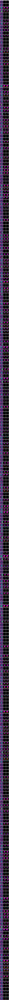

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

LABEL_COLORS = {
    0: (0, 0, 0),         # Background
    1: (0, 102, 204),     # Aorta
    2: (0, 255, 0),       # Gallbladder
    3: (255, 0, 0),       # Left Kidney
    4: (0, 255, 255),     # Right Kidney
    5: (255, 0, 255),     # Liver
    6: (255, 255, 0),     # Pancreas
    7: (153, 0, 255),     # Spleen
    8: (255, 128, 0),     # Stomach
}

def colorize_mask(mask):
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label_id, color in LABEL_COLORS.items():
        color_mask[mask == label_id] = color
    return color_mask

def visualize_predictions(model, loader, device, num_samples=300):
    model.eval()
    images_list, gt_list, pred_list = [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            preds = outputs.argmax(dim=1)

            images_list.append(images.cpu())
            gt_list.append(masks.cpu())
            pred_list.append(preds.cpu())

            if sum([x.shape[0] for x in images_list]) >= num_samples:
                break

    images_all = torch.cat(images_list, dim=0)[:num_samples]
    gt_all = torch.cat(gt_list, dim=0)[:num_samples]
    pred_all = torch.cat(pred_list, dim=0)[:num_samples]

    # Plot
    plt.figure(figsize=(6, num_samples*2))
    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i*3 + 1)
        img = images_all[i].permute(1,2,0)
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.title("Image")

        # Ground Truth
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(colorize_mask(gt_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Ground Truth")

        # Prediction
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(colorize_mask(pred_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Prediction")

    plt.tight_layout()
    plt.show()

visualize_predictions(model, val_loader, device, num_samples=321)

In [ ]:
import torch
import torch.nn.functional as F

def dice_per_class(preds, targets, num_classes, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=num_classes)
    preds_onehot = preds_onehot.permute(0,3,1,2).float()

    targets_onehot = F.one_hot(targets, num_classes=num_classes)
    targets_onehot = targets_onehot.permute(0,3,1,2).float()

    dice_scores = []
    for c in range(num_classes):
        pred_c = preds_onehot[:,c]
        target_c = targets_onehot[:,c]
        intersection = (pred_c * target_c).sum(dim=(0,1,2))
        union = pred_c.sum(dim=(0,1,2)) + target_c.sum(dim=(0,1,2))
        dice = (2*intersection + eps)/(union + eps)
        dice_scores.append(dice.item())

    return dice_scores

In [ ]:
model.eval()
num_classes = 9  # 0:background + 8 organs

with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)  # [B, C, H, W]
        per_class_dice = dice_per_class(outputs, masks, num_classes=num_classes)
        break  # only first batch for demo

organ_names = ["Background", "Aorta", "Gallbladder", "Left Kidney", "Right Kidney",
               "Liver", "Pancreas", "Spleen", "Stomach"]

for name, dice in zip(organ_names, per_class_dice):
    print(f"{name}: {dice*100:.2f}%")


Background: 99.17%
Aorta: 91.55%
Gallbladder: 70.13%
Left Kidney: 90.21%
Right Kidney: 88.64%
Liver: 96.97%
Pancreas: 58.67%
Spleen: 87.71%
Stomach: 69.67%


In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

LABEL_COLORS = {
    0: (0, 0, 0),         # Background
    1: (0, 102, 204),     # Aorta
    2: (0, 255, 0),       # Gallbladder
    3: (255, 0, 0),       # Left Kidney
    4: (0, 255, 255),     # Right Kidney
    5: (255, 0, 255),     # Liver
    6: (255, 255, 0),     # Pancreas
    7: (153, 0, 255),     # Spleen
    8: (255, 128, 0),     # Stomach
}

def colorize_mask(mask):
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label_id, color in LABEL_COLORS.items():
        color_mask[mask == label_id] = color
    return color_mask

def dice_score_per_sample(pred, target, num_classes=9, epsilon=1e-6):
    dice = 0
    for cls in range(1, num_classes):  # skip background
        pred_cls = (pred == cls).float()
        target_cls = (target == cls).float()
        intersection = (pred_cls * target_cls).sum()
        union = pred_cls.sum() + target_cls.sum()
        dice += (2 * intersection + epsilon) / (union + epsilon)
    return dice / (num_classes - 1)  # average over classes

def visualize_predictions(model, loader, device, num_samples=300):
    model.eval()
    images_list, gt_list, pred_list = [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)  # [B, C, H, W]
            preds = outputs.argmax(dim=1)  # get class index per pixel

            images_list.append(images.cpu())
            gt_list.append(masks.cpu())
            pred_list.append(preds.cpu())

            if sum([x.shape[0] for x in images_list]) >= num_samples:
                break

    images_all = torch.cat(images_list, dim=0)[:num_samples]
    gt_all = torch.cat(gt_list, dim=0)[:num_samples]
    pred_all = torch.cat(pred_list, dim=0)[:num_samples]

    # Plot
    plt.figure(figsize=(9, num_samples * 2))
    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i*3 + 1)
        img = images_all[i].permute(1,2,0)  # C,H,W -> H,W,C
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.title("Image")

        # Ground Truth
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(colorize_mask(gt_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Ground Truth")

        # Prediction
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(colorize_mask(pred_all[i]))
        plt.axis('off')

        # Dice score
        dice = dice_score_per_sample(pred_all[i], gt_all[i])
        plt.text(5, 15, f"{dice:.2f}", color="white", fontsize=10,
                 bbox=dict(facecolor='black', alpha=0.6, pad=2))

        if i == 0:
            plt.title("Prediction\nDice")

    plt.tight_layout()
    plt.show()


visualize_predictions(model, val_loader, device, num_samples=321)